<a href="https://colab.research.google.com/github/speedrage56/fastai/blob/main/lesson2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [4]:
from fastbook import *
from fastai.vision.widgets import *

In [5]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [6]:
ims = search_images_ddg('grizzly bear')
len(ims)

200

In [7]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest, show_progress=False)

Path('images/grizzly.jpg')

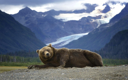

In [8]:
im = Image.open(dest)
im.to_thumb(128,128)

In [9]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [10]:
if not path.exists():
  path.mkdir()
  for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_ddg(f'{o} bear')
    download_images(dest, urls= results)

In [11]:
fns = get_image_files(path)
fns

(#540) [Path('bears/grizzly/ebfde085-5419-486d-8f46-d89e190ae0e3.jpg'),Path('bears/grizzly/50c033f6-ee00-46f0-b32f-bfbdc8378dbb.jpg'),Path('bears/grizzly/92f52bc3-3d26-4ff5-8563-3ba143cd6ae0.jpg'),Path('bears/grizzly/c035a330-b503-48f7-993b-933abd22acfa.jpg'),Path('bears/grizzly/357e4d6b-5c71-4bc2-aa52-072a4f1928bc.jpg'),Path('bears/grizzly/e2dd4292-b183-4f0c-afba-9cb5ac4b0614.jpg'),Path('bears/grizzly/b166aa24-8819-4b6a-b7f4-855ee23698bf.jpg'),Path('bears/grizzly/1a2c3992-7609-44f6-94d2-58e9ede0b1fa.jpg'),Path('bears/grizzly/04c46c5d-f0c1-4e53-9a92-53156578bb8e.jpg'),Path('bears/grizzly/e3e604ec-35fd-42a8-89fb-695ec59396bb.JPG'),Path('bears/grizzly/8341fa7a-3088-4f25-8b1b-9bfe52ef1127.JPG'),Path('bears/grizzly/c63b47f8-36bb-4d51-99e1-6cde168d39d6.jpg'),Path('bears/grizzly/25ba03e9-ddab-4635-9a40-dd56a3c7c4a1.jpeg'),Path('bears/grizzly/cb0c4dc9-8083-4654-a730-14b391146656.jpg'),Path('bears/grizzly/5202f9d1-683d-4bb1-aeaa-2615f56dfb82.jpg'),Path('bears/grizzly/e0ae11cc-55e8-488f-8304-5a

In [12]:
failed = verify_images(fns)
failed

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:3570: UserWarning: image file could not be identified because AVIF support not installed
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:3570: UserWarning: image file could not be identified because AVIF support not installed
  warnings.warn(message)


(#36) [Path('bears/grizzly/1a2c3992-7609-44f6-94d2-58e9ede0b1fa.jpg'),Path('bears/grizzly/e3e604ec-35fd-42a8-89fb-695ec59396bb.JPG'),Path('bears/grizzly/41e046ba-edf1-4694-837f-c62d5250be22.jpg'),Path('bears/grizzly/9be5d10a-4515-41f5-be8c-01a6f5ad019b.jpg'),Path('bears/grizzly/4586828f-229e-4389-b430-b22d0ed4cd69.jpg'),Path('bears/grizzly/32ba7f5c-cad1-4cee-8434-779ddb147ae7.jpg'),Path('bears/grizzly/325f9ecc-3f90-42e3-8c39-677f20f99213.jpg'),Path('bears/grizzly/da16cdda-89b0-4fa5-87cc-cd9ae0ebd7a0.jpg'),Path('bears/grizzly/b58f4cb8-be11-4d8c-8c02-631ffca38771.jpg'),Path('bears/grizzly/c911c013-e10b-4fad-8a38-815f1dac0ea7.jpg'),Path('bears/black/8f9fbb31-bd0b-4b3d-9681-889cd5c78e16.JPG'),Path('bears/black/ef41185f-a7f0-4d04-a6dc-10db19625714.jpg'),Path('bears/black/e9ca02f7-8cdd-4ce0-b599-83dead959918.jpg'),Path('bears/black/e89a7f49-ef96-49a7-8646-e877045dcaa1.jpg'),Path('bears/black/920aaefe-ee21-4802-8793-9ceea87f7648.jpg'),Path('bears/black/c376f2af-0b81-4113-9ac9-083240ce4003.jpg

In [13]:
failed.map(Path.unlink)

(#36) [None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None...]

In [14]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)

)

In [15]:
dls = bears.dataloaders(path)

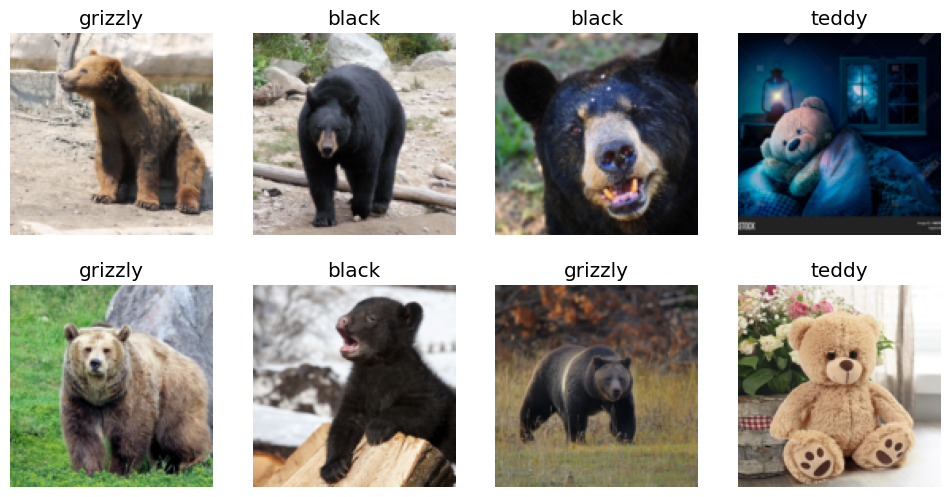

In [16]:
dls.valid.show_batch(max_n=8, nrows=2)

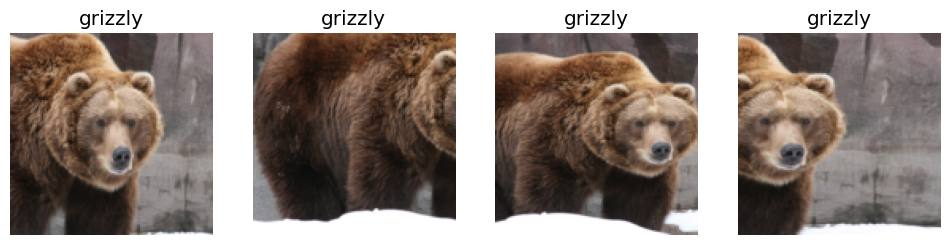

In [17]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls= bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

In [18]:
bears = bears.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                  batch_tfms=aug_transforms())
dls= bears.dataloaders(path)

In [19]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 142MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.419022,0.092084,0.020000,02:02


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.151824,0.102051,0.030000,02:37
1,0.110794,0.110298,0.020000,02:34
2,0.082692,0.112672,0.010000,02:33
3,0.063663,0.113639,0.010000,02:37


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


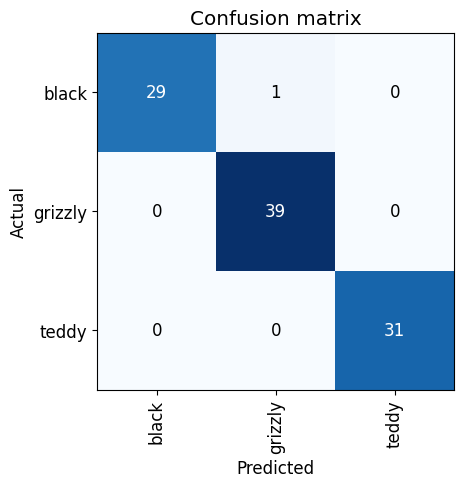

In [20]:
interp= ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

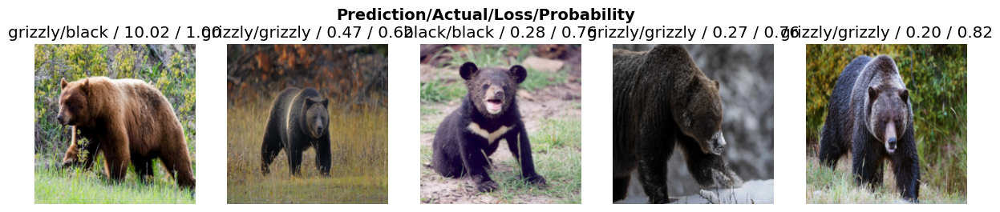

In [21]:
interp.plot_top_losses(5, nrows=1)

In [22]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [25]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [26]:
learn.export()

In [27]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [28]:
learn_inf = load_learner(path/'export.pkl')

/usr/local/lib/python3.11/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


In [29]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([1.1756e-06, 9.9997e-01, 2.7025e-05]))

In [30]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [31]:
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [35]:
img = PILImage.create(btn_upload.data[-1])

In [36]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [37]:
pred,pred_idx,probs = learn_inf.predict(img)

In [38]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 1.0000')

In [39]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [40]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128,128))
  pred,pred_idx,probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [41]:
btn_upload = widgets.FileUpload()

In [42]:
VBox([widgets.Label('Select your bear!'), btn_upload, btn_run, out_pl, lbl_pred])

In [43]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.1/106.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.8/385.8 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 3.9 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall: jupyter-server
    Found existing installation: jupyter-server 1.16.0
    Uninstalling jupyter-server-1.16.0:
      Successfully uninstalled jupyter-server-1.16.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 6.5.7 requires jupyter-client<8,>=5.3.4, but you